# COMPREHENSIVE DATA EXPLORATION WITH PYTHON
[Pedro Marcelino](http://pmarcelino.com) - February 2017

Other Kernels: [Data analysis and feature extraction with Python
](https://www.kaggle.com/pmarcelino/data-analysis-and-feature-extraction-with-python)

----------

<b>"Самое сложное в жизни — это познать себя"</b>

Эта цитата принадлежит Фалесу Милетскому. Фалес был греческим/фонецианским философом, математиком и астрономом, который признан первым человеком в западной цивилизации, который, как известно, развлекался и занимался научной мыслью (источник: https://en.wikipedia.org/wiki/Thales)

Я бы не сказал, что знание ваших данных — это самое сложное в науке о данных, но это отнимает много времени. Поэтому легко пропустить этот начальный шаг и слишком рано прыгнуть в воду.

Поэтому я пытался научиться плавать, прежде чем прыгнуть в воду. На основании [Hair et al. (2013)](https://amzn.to/2JuDmvo), глава «Изучение ваших данных», я сделал все возможное, чтобы выполнить всесторонний, но не исчерпывающий анализ данных. Я далек от того, чтобы сообщить о тщательном исследовании этого ядра, но я надеюсь, что оно может быть полезным для сообщества, поэтому я делюсь тем, как я применил некоторые из этих принципов анализа данных к этой проблеме.

Несмотря на странные названия, которые я дал главам, то, что мы делаем в этом ядре, выглядит примерно так:

1. <b>Понять проблему</b>. Мы рассмотрим каждую переменную и проведем философский анализ их значения и важности для этой проблемы.
2. <b>Унивариантное исследование</b>. Мы просто сосредоточимся на зависимой переменной ("SalePrice") и попытаемся узнать о ней немного больше.
3. <b>Многофакторное исследование</b>. Мы попытаемся понять, как связаны зависимая переменная и независимые переменные.
4. <b>Основная очистка</b>. Мы очистим набор данных и обработаем недостающие данные, выбросы и категориальные переменные.
5. <b>Проверить предположения</b>. Мы проверим, соответствуют ли наши данные предположениям, требуемым для большинства многомерных методов.

Теперь пришло время повеселиться!

In [ ]:
#invite people for the Kaggle party
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import plotly.express as px

In [ ]:
#bring in the six packs
df_train = pd.read_csv('https://raw.githubusercontent.com/pav-sahnyuk/datasets/main/House%20Prices%20-%20Advanced%20Regression%20Techniques_train.csv')

In [ ]:
#check the decoration
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

# 1. Итак... Чего нам ожидать?

Чтобы понять наши данные, мы можем посмотреть на каждую переменную и попытаться понять их значение и отношение к этой проблеме. Я знаю, что это отнимает много времени, но это даст нам представление о нашем наборе данных.

Чтобы иметь некоторую дисциплину в нашем анализе, мы можем создать электронную таблицу Excel со следующими столбцами:
* <b>Переменная</b> — имя переменной.
* <b>Тип</b> — Идентификация типа переменных. Есть два возможных значения для этого поля: «числовой» или «категориальный». Под «числовыми» мы подразумеваем переменные, для которых значения являются числами, а под «категориальными» мы подразумеваем переменные, для которых значения являются категориями.
* <b>Сегмент</b> — Идентификация сегмента переменных. Мы можем определить три возможных сегмента: здание, пространство или местоположение. Когда мы говорим «здание», мы имеем в виду переменную, относящуюся к физическим характеристикам здания (например, «Общее качество»). Когда мы говорим «пространство», мы имеем в виду переменную, которая сообщает пространственные свойства дома (например, «TotalBsmtSF»). Наконец, когда мы говорим «местоположение», мы имеем в виду переменную, которая дает информацию о месте, где расположен дом (например, «Район»).
* <b>Ожидание</b> — наше ожидание относительно влияния переменной в «Цена продажи». Мы можем использовать категориальную шкалу с возможными значениями «Высокий», «Средний» и «Низкий».
* <b>Заключение</b> — наши выводы о важности переменной после беглого просмотра данных. Мы можем придерживаться той же категориальной шкалы, что и в «Ожидании».
* <b>Комментарии</b> — любые общие комментарии, которые пришли нам в голову.

В то время как «Тип» и «Сегмент» предназначены только для возможного использования в будущем, столбец «Ожидание» важен, потому что он поможет нам развить «шестое чувство». Чтобы заполнить эту колонку, мы должны прочитать описание всех переменных и, одну за другой, спросить себя:

* Думаем ли мы об этой переменной, когда покупаем дом? (например, когда мы думаем о доме нашей мечты, заботимся ли мы о его «типе облицовки каменной кладкой»?).
* Если да, то насколько важной может быть эта переменная? (например, как влияет наличие материала «Отлично» на внешнем виде вместо «Плохо»? И наличие «Отлично» вместо «Хорошо»?).
* Эта информация уже описана в какой-либо другой переменной? (например, если «Контур земной поверхности» определяет плоскостность объекта, действительно ли нам нужно знать «Уклон земной поверхности»?).

После этого сложного упражнения мы можем отфильтровать электронную таблицу и внимательно посмотреть на переменные с «Высоким» «Ожиданием». Затем мы можем перейти к некоторым графикам разброса между этими переменными и «Цена продажи», заполнив столбец «Вывод», который является просто исправлением наших ожиданий.

Я прошел через этот процесс и пришел к выводу, что следующие переменные могут играть важную роль в этой проблеме:

* OverallQual - Общее качество (это переменная, которая мне не нравится, потому что я не знаю, как она вычислялась; забавным упражнением было бы предсказать «Общее качество», используя все другие доступные переменные).
* YearBuilt -Год постройки.
* TotalBsmtSF - площадь подвала
* GrLivArea - жилая площадь.

В итоге я получил две «строительные» переменные («OverallQual» и «YearBuilt») и две «пространственные» переменные («TotalBsmtSF» и «GrLivArea»). Это может быть немного неожиданным, поскольку противоречит мантре недвижимости, согласно которой все, что имеет значение, это «место, место и еще раз место». Возможно, что этот быстрый процесс проверки данных был немного жестким для категориальных переменных. Например, я ожидал, что переменная «Окрестности» будет более актуальной, но после проверки данных я исключил ее. Возможно, это связано с использованием точечных диаграмм вместо блок-диаграмм, которые больше подходят для визуализации категориальных переменных. То, как мы визуализируем данные, часто влияет на наши выводы.

Тем не менее, основная цель этого упражнения заключалась в том, чтобы немного подумать о наших данных и ожиданиях, поэтому я думаю, что мы достигли своей цели. Теперь пришло время для «немного меньше разговоров, немного больше действий, пожалуйста». Давайте <b>встряхнем его!</b>

# 2. Перво-наперво: анализ «SalePrice»

«SalePrice» - стоимость квартиры является целью нашего анализа. Это как когда мы собираемся на вечеринку. У нас всегда есть причина быть там. Обычно такой причиной являются женщины. (отказ от ответственности: адаптируйте его к мужчинам, танцам или алкоголю, в соответствии с вашими предпочтениями)

Используя аналогию с женщинами, давайте создадим небольшую историю, историю «Как мы встретили «SalePrice».

*Все началось на нашей Kaggle вечеринке, когда мы искали партнера по танцам. Через некоторое время поиска на танцполе мы увидели возле бара девушку в танцевальных туфлях. Это знак того, что она здесь, чтобы танцевать. Мы тратим много времени на прогнозное моделирование и участие в конкурсах аналитиков, поэтому общение с девушками не входит в число наших суперспособностей. Тем не менее, мы попробовали:*

* «Привет, я Каггли! А вы? "Цена продажи"? Какое красивое имя! Вы знаете «SalePrice», не могли бы вы дать мне некоторые данные о вас? Я только что разработал модель для расчета вероятности успешных отношений между двумя людьми. Я хотел бы применить это к нам!»*

In [ ]:
#descriptive statistics summary
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

*'Очень хорошо... Кажется, ваша минимальная цена больше нуля. Превосходно! У тебя нет ни одной из тех личных черт, которые разрушили бы мою модель! У вас есть какая-нибудь фотография, которую вы можете отправить мне? Я не знаю... типа, ты на пляже... или, может быть, селфи в спортзале?'*

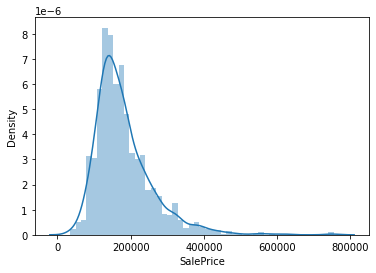

In [ ]:
#histogram
sns.distplot(df_train['SalePrice']);

In [ ]:
# plot the dataset, referencing dataframe column names
import altair as alt
alt.Chart(df_train).mark_bar().encode(
  x=alt.X('SalePrice', bin=alt.Bin(maxbins=50)),
  y='count()',
).interactive()

alt.Chart(...)

In [ ]:
px.histogram(df_train, x='SalePrice')

*'Ах! Я вижу, ты пользуешься косметикой морской волны, когда выходишь на улицу... Это так элегантно! Я также вижу, что вы:*

* <b>Отклонение от нормального распределения.</b>
* <b>Имеет заметную положительную асимметрию.</b>
* <b>Показывает остроконечность (островеришинность - эксцесс (Kurtosis)).</b>

* Становится интересно! 'SalePrice', не могли бы вы дать мне мерки вашего тела?'

In [ ]:
#skewness and kurtosis
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


*'Удивительно! Если мой калькулятор любви верен, наша вероятность успеха составляет 97,834657%. Я думаю, мы должны встретиться снова! Пожалуйста, сохраните мой номер и позвоните мне, если будете свободны в следующую пятницу. До скорой встречи, крокодил!»*

# 'SalePrice', ее приятели и ее интересы

* Военная мудрость - выбрать местность, на которой вы будете сражаться. Как только «SalePrice» ушел, мы пошли в социальную сеть. Да, теперь это становится серьезным. Обратите внимание, что это не преследование. Это просто интенсивное исследование человека, если вы понимаете, о чем я.*

* Судя по ее профилю, у нас есть общие друзья. Помимо Чака Норриса, мы оба знаем «GrLivArea» и «TotalBsmtSF». Более того, у нас также есть общие интересы, такие как «OverallQual» и «YearBuilt». Выглядит многообещающе!*

*Чтобы получить максимальную отдачу от нашего исследования, мы начнем с внимательного изучения профилей наших общих друзей, а позже сосредоточимся на наших общих интересах.*

### Relationship with numerical variables

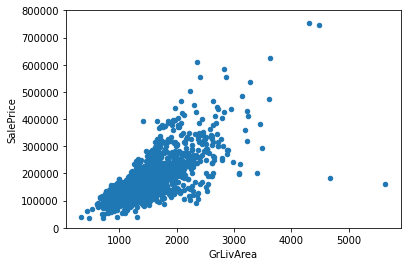

In [ ]:
#scatter plot grlivarea/saleprice
var = 'GrLivArea'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

In [ ]:
alt.Chart(df_train).mark_circle(size=60).encode(
    x='GrLivArea',
    y='SalePrice',
#    color='Origin',
    tooltip=['Id']
).interactive()

alt.Chart(...)

In [ ]:
px.scatter(x=df_train.GrLivArea,
    y=df_train.SalePrice, hover_name=df_train.Id)

*Хммм... Кажется, что "SalePrice" и "GrLivArea" действительно старые друзья, с <b>линейной зависимостью.</b>*

*А как насчет «TotalBsmtSF»?*

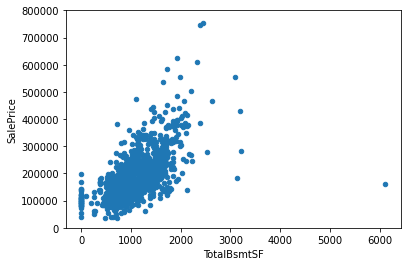

In [ ]:
#scatter plot totalbsmtsf/saleprice
var = 'TotalBsmtSF'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000))

In [ ]:
alt.Chart(df_train).mark_circle(size=60).encode(
    x='TotalBsmtSF',
    y='SalePrice',
    color='SaleType',
    size = 'GrLivArea',
    tooltip=['Id']
).properties(
  width=800
).interactive()

alt.Chart(...)

In [ ]:
px.scatter(data_frame=df_train, x=[df_train.TotalBsmtSF],
    y=df_train.SalePrice, hover_name=df_train.Id,
    #color="SaleType",
                 size='GrLivArea', hover_data=['Id'], trendline="ols")

In [ ]:
interval = alt.selection_interval()

base = alt.Chart(df_train).mark_point().encode(
  y='SalePrice',
  color=alt.condition(interval, 'SaleType', alt.value('lightgray'))
  #color='SaleType'
).properties(
  selection=interval
)

base.encode(x='TotalBsmtSF') | base.encode(x='GrLivArea')

alt.HConcatChart(...)

* 'TotalBsmtSF' также большой друг 'SalePrice', но эти отношения кажутся гораздо более эмоциональными! Все нормально и вдруг в <b>сильной линейной (экспоненциальной?)</b> реакции все меняется. Более того, ясно, что иногда TotalBsmtSF закрывается сам по себе и не дает нулевое значение SalesPrice.*

### Связь с категориальными признаками

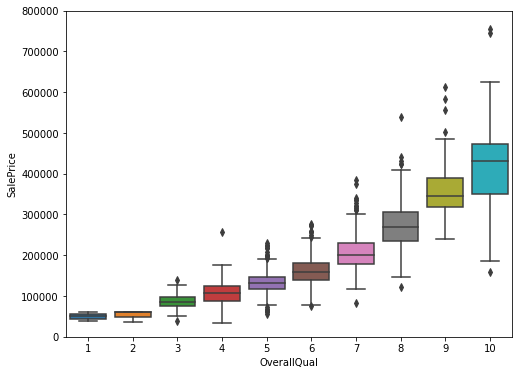

In [ ]:
#box plot overallqual/saleprice
var = 'OverallQual'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

In [ ]:
alt.Chart(df_train).mark_boxplot(extent='min-max').encode(
    x='OverallQual:O',
    y='SalePrice:Q',
    color ='OverallQual:N',

    #size = 'GrLivArea',
    tooltip=['Id']
).properties(
  width=800
).interactive()

alt.Chart(...)

In [ ]:
px.box(df_train, x= 'OverallQual', y="SalePrice", color="OverallQual",
                 #size='GrLivArea',
       hover_data=['Id'])

*Как и все симпатичные девушки, «SalePrice» пользуется «OverallQual». На заметку: подумайте, подходит ли McDonald's для первого свидания.*

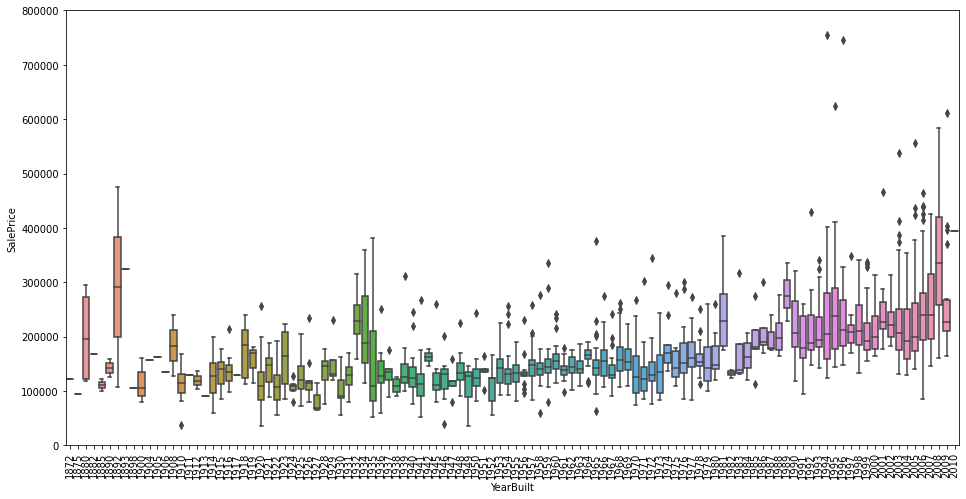

In [ ]:
var = 'YearBuilt'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);
plt.xticks(rotation=90);

In [ ]:
alt.Chart(df_train).mark_boxplot(extent='min-max').encode(
    x='YearBuilt:O',
    y='SalePrice:Q',
    color ='YearBuilt:N',

    #size = 'GrLivArea',
    tooltip=['Id']
).properties(
  width=1200
).interactive()

alt.Chart(...)

In [ ]:
px.box(df_train, x= 'YearBuilt', y="SalePrice", color="YearBuilt",
                 #size='GrLivArea',
       hover_data=['Id'])

*Хотя это не сильная тенденция, я бы сказал, что «SalePrice» более склонен тратить больше денег на новые вещи, чем на старые реликвии.*

<b>Примечание</b>: мы не знаем, указана ли цена продажи в постоянных ценах. Постоянные цены пытаются устранить влияние инфляции. Если «Цена продажи» не указана в постоянных ценах, она должна быть, чтобы цены были сопоставимы по годам.

### В итоге

Если отбросить истории, то можно сделать вывод, что:

* «GrLivArea» и «TotalBsmtSF», кажется, линейно связаны с «SalePrice». Обе зависимости положительны, что означает, что при увеличении одной переменной увеличивается и другая. В случае «TotalBsmtSF» мы видим, что наклон линейной зависимости особенно высок.
* «OverallQual» и «YearBuilt», по-видимому, также связаны с «SalePrice». Взаимосвязь кажется более сильной в случае «OverallQual», где блочная диаграмма показывает, как отпускные цены увеличиваются с общим качеством.

Мы только что проанализировали четыре переменные, но есть много других, которые мы должны проанализировать. Хитрость здесь, по-видимому, заключается в выборе правильных функций (выбор функций), а не в определении сложных отношений между ними (инженерия функций).

Тем не менее, давайте отделим зёрна от плевел.

# 3. Сохраняйте спокойствие и работайте с умом

До сих пор мы просто следовали своей интуиции и анализировали переменные, которые считали важными. Несмотря на наши усилия придать объективный характер нашему анализу, мы должны сказать, что наша исходная точка была субъективной.

Мне, как инженеру, такой подход не нравится. Все мое образование было направлено на развитие дисциплинированного ума, способного противостоять ветрам субъективности. На это есть причина. Попробуйте быть субъективным в проектировании конструкций, и вы увидите, как физика заставляет вещи рушиться. Это может повредить.

Итак, давайте преодолеем инерцию и проведем более объективный анализ.

### «Плазменный суп»

«В самом начале не было ничего, кроме плазменного супа. То, что известно об этих кратких моментах времени в начале нашего изучения космологии, в значительной степени является предположительным. Однако наука разработала некоторый набросок того, что, вероятно, произошло, основываясь на том, что сегодня известно о Вселенной». (источник: http://umich.edu/~gs265/bigbang.htm)

Чтобы исследовать вселенную, мы начнем с некоторых практических рецептов, чтобы понять смысл нашего «плазменного супа»:
* Матрица корреляции (стиль тепловой карты).
* Матрица корреляции «SalePrice» (увеличенная тепловая карта).
* Графики разброса между наиболее коррелированными переменными (движение в стиле Джаггера).

#### Correlation matrix (heatmap style)

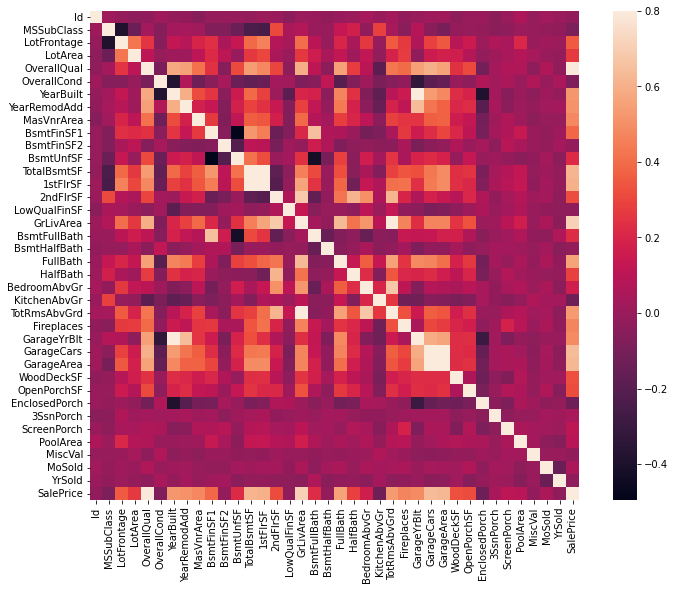

In [ ]:
#correlation matrix
corrmat = df_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

На мой взгляд, эта тепловая карта — лучший способ получить быстрый обзор нашего «плазменного супа» и его взаимосвязей. (Спасибо, @seaborn!)

На первый взгляд мое внимание привлекают два красных квадрата. Первый относится к переменным «TotalBsmtSF» и «1stFlrSF», а второй — к переменным «Garage*X*». Оба случая показывают, насколько значительна корреляция между этими переменными. На самом деле эта корреляция настолько сильна, что может указывать на ситуацию мультиколлинеарности. Если подумать об этих переменных, то можно сделать вывод, что они дают почти одинаковую информацию, поэтому мультиколлинеарность действительно имеет место. Тепловые карты отлично подходят для обнаружения подобных ситуаций, а в задачах, в которых преобладает выбор функций, таких как наша, они являются важным инструментом.

Еще одна вещь, которая привлекла мое внимание, — это корреляция «Цена продажи». Мы видим, как наши хорошо известные «GrLivArea», «TotalBsmtSF» и «OverallQual» говорят большое «Привет!», но мы также можем видеть множество других переменных, которые следует принимать во внимание. Это то, что мы будем делать дальше.

#### Корреляционная матрица «SalePrice» (стиль тепловой карты с увеличением)

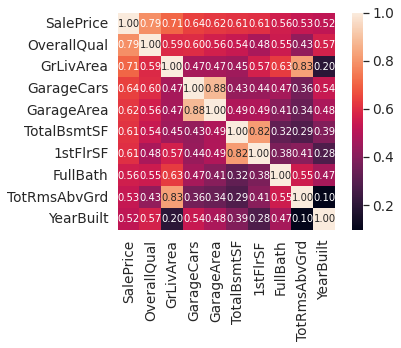

In [ ]:
#saleprice correlation matrix
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, \
                 yticklabels=cols.values, xticklabels=cols.values)
plt.show()

Согласно нашему хрустальному шару, эти переменные больше всего коррелируют с «SalePrice». Мои мысли по этому поводу:

* 'OverallQual', 'GrLivArea' и 'TotalBsmtSF' тесно связаны с 'SalePrice'. Проверять!
* «GarageCars» и «GarageArea» также являются одними из наиболее сильно коррелирующих переменных. Однако, как мы обсуждали в последнем подпункте, количество автомобилей, которые помещаются в гараж, является следствием площади гаража. «GarageCars» и «GarageArea» как братья-близнецы. Вы никогда не сможете их различить. Поэтому в нашем анализе нам нужна только одна из этих переменных (мы можем оставить «GarageCars», так как ее корреляция с «SalePrice» выше).
* TotalBsmtSF и 1stFloor тоже кажутся братьями-близнецами. Мы можем оставить «TotalBsmtSF» просто для того, чтобы сказать, что наша первая догадка была верной (перечитайте «Итак… Чего нам ожидать?»).
* "Полная ванна"?? Действительно?
* 'TotRmsAbvGrd' и 'GrLivArea', снова братья-близнецы. Это набор данных из Чернобыля?
* Ах... "YearBuilt"... Кажется, что "YearBuilt" немного коррелирует с "SalePrice". Честно говоря, мне страшно думать о «YearBuilt», потому что я начинаю чувствовать, что мы должны провести небольшой анализ временных рядов, чтобы сделать это правильно. Я оставлю это как домашнее задание для вас.

Перейдем к точечным графикам.

In [ ]:
df1 = df_train[['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']]

In [ ]:
corr = df1.corr()

In [ ]:
px.imshow(corr, text_auto=True, aspect='auto')

#### Диаграммы разброса между «SalePrice» и коррелированными переменными (движение в стиле Джаггера)

Будьте готовы к тому, что вы собираетесь увидеть. Должен признаться, что когда я впервые увидел эти точечные графики, я был просто поражен! Так много информации в столь коротком пространстве... Это просто потрясающе. Еще раз спасибо @seaborn! Ты заставляешь меня двигаться как Джаггер!

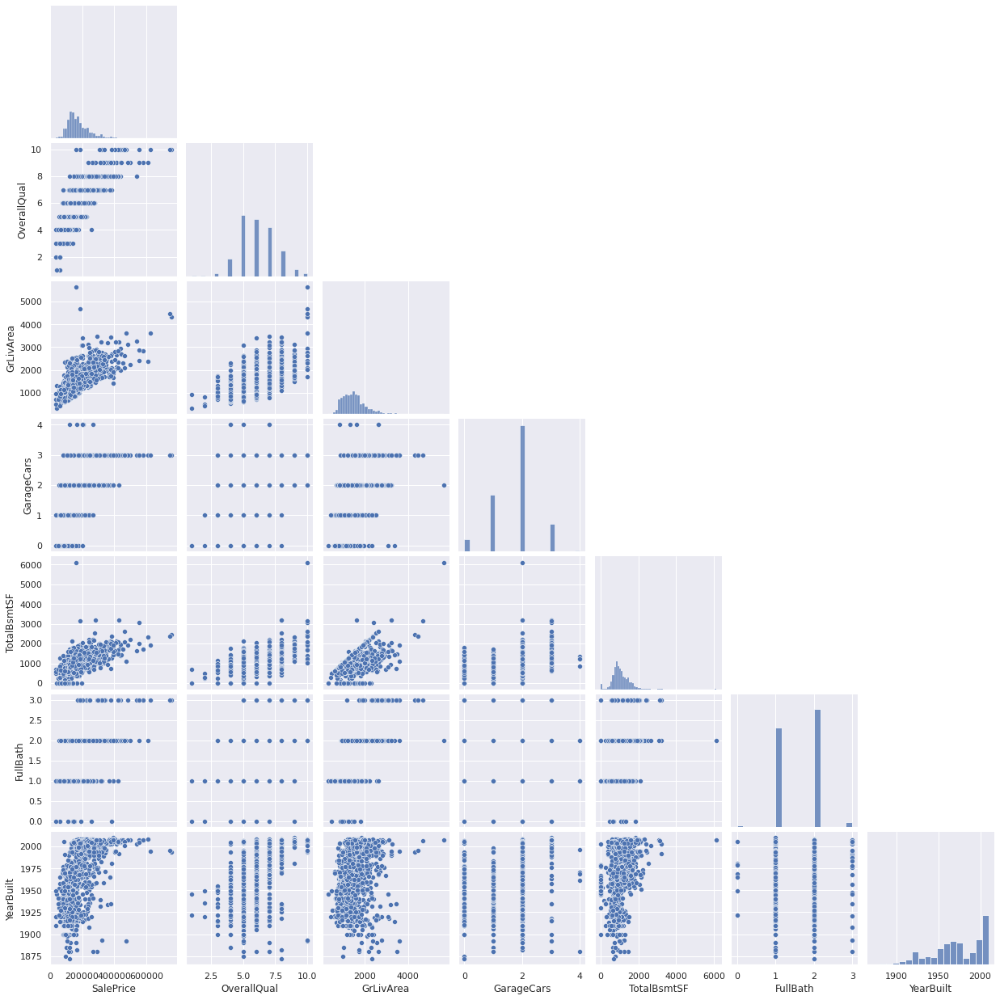

In [ ]:
#scatterplot
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(df_train[cols], size = 2.5, corner=True, diag_kind="hist")
plt.show();

In [ ]:
alt.Chart(df1).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
#    color='Origin:N'
).properties(
    width=150,
    height=150
).repeat(
    row=['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt'],
    column=['YearBuilt','FullBath','GarageCars','GrLivArea','OverallQual', 'TotalBsmtSF', 'SalePrice']
).interactive()

alt.RepeatChart(...)

In [ ]:
'''
fig.update_layout(
    #title='Iris Data set',
    #dragmode='select',
    width=1800,
    height=1200,
    #hovermode='closest',
)

fig.show()
'''

In [ ]:
px.scatter_matrix(df1, width=1800, height=1200)

Хотя мы уже знаем некоторые из основных цифр, этот мегаграфик рассеяния дает нам разумное представление о взаимосвязях между переменными.

Одна из цифр, которая может показаться нам интересной, находится между «TotalBsmtSF» и «GrLiveArea». На этом рисунке мы видим, как точки рисуют линейную линию, которая почти действует как граница. Вполне логично, что большинство точек остаются ниже этой линии. Площадь подвала может быть равна надземной жилой площади, но не ожидается, что подвальная площадь будет больше, чем наземная жилая площадь (если только вы не пытаетесь купить бункер).

Заставить задуматься может и сюжет о «SalePrice» и «YearBuilt». В нижней части «облака точек» мы видим то, что почти кажется застенчивой экспоненциальной функцией (проявляйте творческий подход). Мы также можем видеть эту же тенденцию в верхней части «облака точек» (будьте еще более изобретательными). Кроме того, обратите внимание, как набор точек, относящихся к прошлым годам, имеет тенденцию оставаться выше этого предела (я просто хотел сказать, что цены сейчас растут быстрее).

Ладно, хватит теста Роршаха. Давайте перейдем к тому, чего не хватает: недостающих данных!

#№ 4. Отсутствующие данные

Важные вопросы при размышлении об отсутствующих данных:

* Насколько распространены недостающие данные?
* Являются ли отсутствующие данные случайными или имеют закономерность?

Ответ на эти вопросы важен по практическим причинам, поскольку отсутствие данных может означать сокращение размера выборки. Это может помешать нам продолжить анализ. Более того, с точки зрения существа, нам необходимо убедиться, что процесс отсутствующих данных не является предвзятым и не скрывает неудобную правду.

In [ ]:
df_train.isnull().sum().sort_values(ascending=False)

PoolQC         1453
MiscFeature    1406
Alley          1369
Fence          1179
FireplaceQu     690
               ... 
ExterQual         0
Exterior2nd       0
Exterior1st       0
RoofMatl          0
SalePrice         0
Length: 81, dtype: int64

In [ ]:
df_train.isnull().count().sort_values(ascending=False)

Id             1460
CentralAir     1460
GarageYrBlt    1460
GarageType     1460
FireplaceQu    1460
               ... 
MasVnrArea     1460
MasVnrType     1460
Exterior2nd    1460
Exterior1st    1460
SalePrice      1460
Length: 81, dtype: int64

In [ ]:
#missing data
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


Давайте проанализируем это, чтобы понять, как обрабатывать недостающие данные.

Мы будем считать, что когда более 15% данных отсутствует, мы должны удалить соответствующую переменную и сделать вид, что ее никогда не существовало. Это означает, что мы не будем пытаться заполнить недостающие данные в этих случаях. В соответствии с этим существует набор переменных (например, «PoolQC», «MiscFeature», «Alley» и т. д.), которые мы должны удалить. Вопрос в том, не пропустим ли мы эти данные? Я так не думаю. Ни одна из этих переменных не кажется очень важной, поскольку большинство из них не являются аспектами, о которых мы думаем при покупке дома (может быть, поэтому данные отсутствуют?). Более того, присмотревшись к переменным, мы могли бы сказать, что такие переменные, как «PoolQC», «MiscFeature» и «FireplaceQu», являются сильными кандидатами на выбросы, поэтому мы будем рады их удалить.

Что касается остальных случаев, мы видим, что переменные 'Garage*X*' имеют одинаковое количество пропущенных данных. Бьюсь об заклад, недостающие данные относятся к тому же набору наблюдений (хотя я не буду проверять это, это всего лишь 5%, и мы не должны тратить 20 долларов на 5-долларовые задачи). Поскольку наиболее важная информация о гаражах выражается с помощью «GarageCars», и учитывая, что мы говорим только о 5% отсутствующих данных, я удалю упомянутые переменные «Garage*X*». Та же логика применима к переменным 'Bsmt*X*'.

Что касается «MasVnrArea» и «MasVnrType», мы можем считать, что эти переменные не являются существенными. Кроме того, они имеют сильную корреляцию с уже рассмотренными показателями YearBuilt и TotalQual. Таким образом, мы не потеряем информацию, если удалим «MasVnrArea» и «MasVnrType».

Наконец, у нас есть одно отсутствующее наблюдение в «Электрике». Поскольку это всего лишь одно наблюдение, мы удалим это наблюдение и сохраним переменную.

Таким образом, для обработки отсутствующих данных мы удалим все переменные с отсутствующими данными, кроме переменной «Электроснабжение». В «Электрике» мы просто удалим наблюдение с отсутствующими данными.

In [ ]:
#dealing with missing data
df_train = df_train.drop((missing_data[missing_data['Total'] > 1]).index,1)
df_train = df_train.drop(df_train.loc[df_train['Electrical'].isnull()].index)
df_train.isnull().sum().max() #just checking that there's no missing data missing...

0

# Вон лжецы!

Выбросы — это тоже то, о чем мы должны знать. Почему? Потому что выбросы могут заметно повлиять на наши модели и могут быть ценным источником информации, дающим нам представление о конкретном поведении.

Выбросы — сложная тема, и она заслуживает большего внимания. Здесь мы просто проведем быстрый анализ стандартного отклонения «SalePrice» и набора диаграмм рассеяния.

### Одномерный анализ

Главной задачей здесь является установление порога, который определяет наблюдение как выброс. Для этого мы стандартизируем данные. В этом контексте стандартизация данных означает преобразование значений данных так, чтобы они имели среднее значение, равное 0, и стандартное отклонение, равное 1.

In [ ]:
#standardizing data
saleprice_scaled = StandardScaler().fit_transform(df_train['SalePrice'][:,np.newaxis]);
low_range = saleprice_scaled[saleprice_scaled[:,0].argsort()][:10]
high_range= saleprice_scaled[saleprice_scaled[:,0].argsort()][-10:]
print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-1.83820775]
 [-1.83303414]
 [-1.80044422]
 [-1.78282123]
 [-1.77400974]
 [-1.62295562]
 [-1.6166617 ]
 [-1.58519209]
 [-1.58519209]
 [-1.57269236]]

outer range (high) of the distribution:
[[3.82758058]
 [4.0395221 ]
 [4.49473628]
 [4.70872962]
 [4.728631  ]
 [5.06034585]
 [5.42191907]
 [5.58987866]
 [7.10041987]
 [7.22629831]]


In [ ]:
saleprice_scaled

array([[ 0.34704187],
       [ 0.0071701 ],
       [ 0.53585953],
       ...,
       [ 1.07713679],
       [-0.48847623],
       [-0.42081658]])

Как выглядит «SalePrice» в новой одежде:

* Значения нижнего диапазона аналогичны и не слишком далеки от 0.
* Значения верхнего диапазона далеки от 0, а значения 7. что-то действительно выходят за пределы допустимого диапазона.

На данный момент мы не будем рассматривать ни одно из этих значений как выброс, но мы должны быть осторожны с этими двумя значениями 7. something.

### Bivariate analysis (двумерный анализ)

Следующие графики разброса (точечные диаграммы, scatter plots) мы уже знаем наизусть. Однако, когда мы смотрим на вещи с новой точки зрения, всегда есть что открыть. Как сказал Алан Кей, «изменение точки зрения стоит 80 баллов IQ».

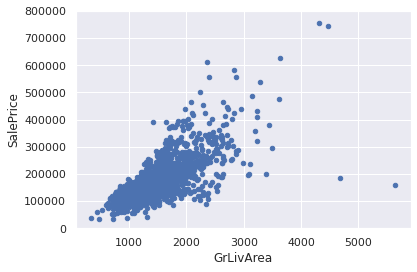

In [ ]:
#bivariate analysis saleprice/grlivarea
var = 'GrLivArea'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

In [ ]:
px.scatter(x=df_train.GrLivArea,
    y=df_train.SalePrice, hover_name=df_train.Id)

Что было выявлено:

* Два значения с большим «GrLivArea» кажутся странными, и они не следуют за большинством. Мы можем предположить, почему это происходит. Возможно, они относятся к сельскохозяйственным угодьям, и это может объяснить низкую цену. Я не уверен в этом, но я совершенно уверен, что эти две точки не являются типичным случаем. Поэтому мы определим их как выбросы и удалим.
* Два наблюдения в верхней части графика — это те 7.something (7.что-то) наблюдения, с которыми, как мы сказали, нам следует быть осторожными. Они выглядят как два особых случая, однако они, кажется, следуют тенденции. По этой причине мы их сохраним.

In [ ]:
#deleting points
df_train.sort_values(by = 'GrLivArea', ascending = False)[:2]
df_train = df_train.drop(df_train[df_train['Id'] == 1299].index)
df_train = df_train.drop(df_train[df_train['Id'] == 524].index)

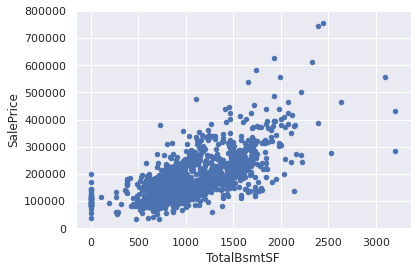

In [ ]:
#bivariate analysis saleprice/grlivarea
var = 'TotalBsmtSF'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
data.plot.scatter(x=var, y='SalePrice', ylim=(0,800000));

In [ ]:
px.scatter(x=df_train.GrLivArea,
    y=df_train.SalePrice, hover_name=df_train.Id)

У нас может возникнуть соблазн исключить некоторые наблюдения (например, TotalBsmtSF > 3000), но я полагаю, что это того не стоит. Мы можем жить с этим, так что мы ничего не будем делать.

# 5. Getting hard core

В романе Айн Рэнд «Атлант расправил плечи» часто повторяется вопрос: кто такой Джон Галт? Большая часть книги посвящена поиску ответа на этот вопрос.

Теперь я чувствую Рэндиана. Кто такой «SalePrice»?

Ответ на этот вопрос заключается в проверке предположений, лежащих в основе статистических основ многомерного анализа. Мы уже провели некоторую очистку данных и многое узнали о «SalePrice». Теперь пришло время углубиться и понять, как «SalePrice» соответствует статистическим предположениям, что позволяет нам применять многомерные методы.

Согласно [Hair et al. (2013)](https://amzn.to/2uC3j9p), необходимо проверить четыре предположения:

* <b>Нормальность</b>. Когда мы говорим о нормальности, мы имеем в виду, что данные должны выглядеть как нормальное распределение. Это важно, потому что на этом основаны некоторые статистические тесты (например, t-статистика). В этом упражнении мы просто проверим одномерную нормальность для «SalePrice» (что является ограниченным подходом). Помните, что одномерная нормальность не гарантирует многомерную нормальность (а это то, что нам хотелось бы иметь), но помогает. Еще одна деталь, которую следует учитывать, заключается в том, что в больших выборках (> 200 наблюдений) нормальность не является такой проблемой. Однако, если мы решим нормальность, мы избежим многих других проблем (например, гетероскедатичности), так что это основная причина, по которой мы проводим этот анализ.

* <b>Гомоскедастичность</b> — я просто надеюсь, что написал правильно. Гомоскедастичность относится к «предположению, что зависимая переменная (переменные) демонстрирует одинаковые уровни дисперсии во всем диапазоне переменных-предикторов» [(Hair et al., 2013)] (https://amzn.to/2uC3j9p). Гомоскедастичность желательна, потому что мы хотим, чтобы член ошибки был одинаковым для всех значений независимых переменных.

* <b>Линейность</b>. Самый распространенный способ оценить линейность – это изучить графики рассеяния и найти линейные закономерности. Если закономерности нелинейны, стоит изучить преобразования данных. Однако мы не будем вдаваться в подробности, потому что большинство графиков рассеяния, которые мы видели, имеют линейные зависимости.

* <b>Отсутствие коррелированных ошибок</b>. Коррелированные ошибки, как следует из определения, возникают, когда одна ошибка коррелирует с другой. Например, если одна положительная ошибка систематически вызывает отрицательную ошибку, это означает, что между этими переменными существует связь. Это часто происходит во временных рядах, где некоторые закономерности связаны со временем. Мы тоже не будем вдаваться в это. Однако, если вы что-то обнаружите, попробуйте добавить переменную, которая может объяснить получаемый вами эффект. Это наиболее распространенное решение для коррелированных ошибок.

Как вы думаете, что бы сказал Элвис об этом длинном объяснении? «Меньше разговоров, больше действий, пожалуйста»? Возможно... Кстати, вы знаете, какой последний хит Элвиса был последним?

(...)

### В поисках нормальности

Суть здесь в том, чтобы протестировать «SalePrice» очень бережливым способом. Мы сделаем это, обратив внимание на:

* <b>Гистограмма</b> — эксцесс и асимметрия (Kurtosis and skewness).
* <b>График нормальной вероятности (Normal probability plot)</b>. Распределение данных должно точно следовать диагонали, представляющей нормальное распределение.

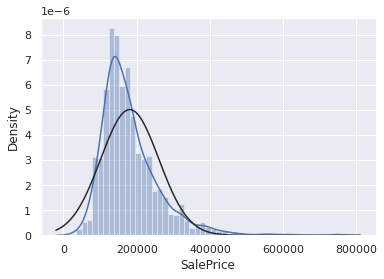

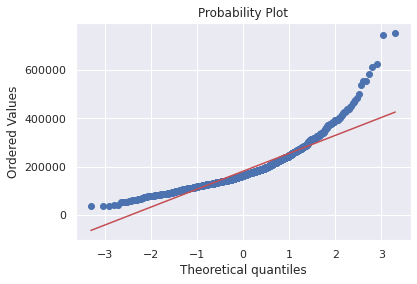

In [ ]:
#histogram and normal probability plot
sns.distplot(df_train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

Хорошо, «SalePrice» не является нормальным. Он показывает «остроконечность», положительную асимметрию (positive skewness) и не следует диагональной линии.

Но не все потеряно. Простое преобразование данных может решить проблему. Это одна из замечательных вещей, которые вы можете узнать из статистических книг: в случае положительной асимметрии логарифмические преобразования обычно работают хорошо. Когда я обнаружил это, я почувствовал себя студентом Хогвартса, открывшим новое крутое заклинание.

*Авада Кедавра!*

In [ ]:
#applying log transformation
df_train['SalePrice'] = np.log(df_train['SalePrice'])

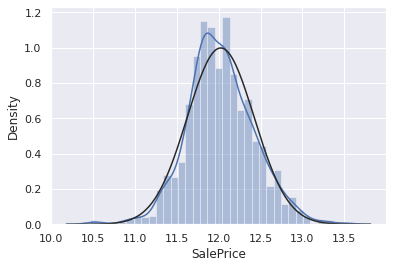

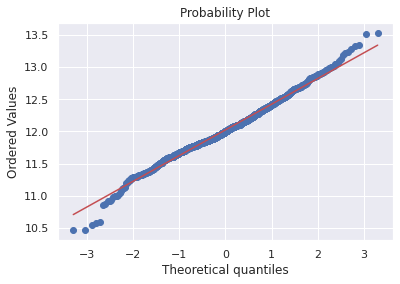

In [ ]:
#transformed histogram and normal probability plot
sns.distplot(df_train['SalePrice'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

Сделали!
Давайте проверим, что происходит с 'GrLivArea'.

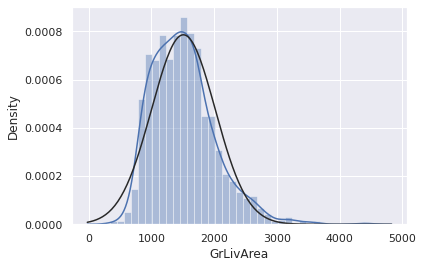

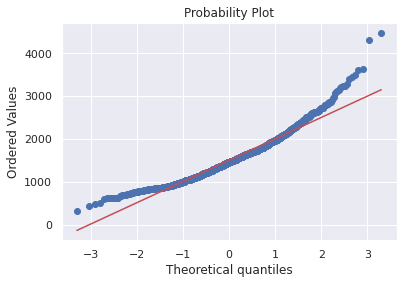

In [ ]:
#histogram and normal probability plot
sns.distplot(df_train['GrLivArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

перекос (like skewness) ... *Авада кедавра!*

In [ ]:
#data transformation
df_train['GrLivArea'] = np.log(df_train['GrLivArea'])

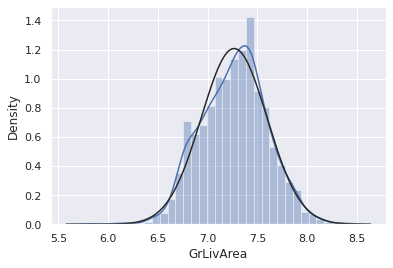

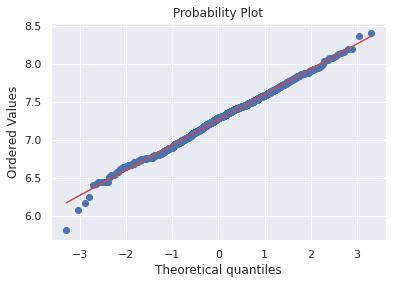

In [ ]:
#transformed histogram and normal probability plot
sns.distplot(df_train['GrLivArea'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

Следующий, пожалуйста...

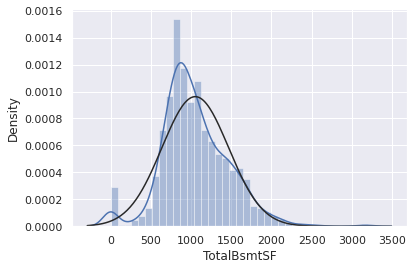

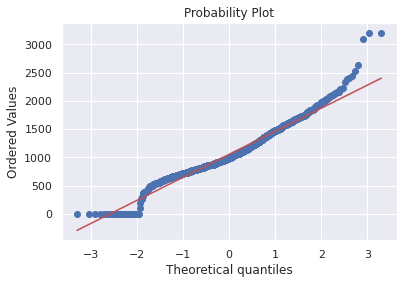

In [ ]:
#histogram and normal probability plot
sns.distplot(df_train['TotalBsmtSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train['TotalBsmtSF'], plot=plt)

Хорошо, что же мы имеем здесь?

* Что-то, что вообще представляет собой асимметрию.
* Значительное количество наблюдений с нулевым значением (дома без подвала).
* Большая проблема, потому что нулевое значение не позволяет нам выполнять логарифмическое преобразование.

Чтобы применить логарифмическое преобразование, мы создадим бинарную по наличию или отсутствию подвала. Затем мы выполним логарифмическое преобразование для всех ненулевых наблюдений, игнорируя те, которые имеют нулевое значение. Таким образом, мы можем преобразовывать данные, не теряя эффекта наличия или отсутствия подвала.

Я не уверен, что этот подход правильный. Просто мне это казалось правильным. Это то, что я называю «инженерией высокого риска».

In [ ]:
#create column for new variable (one is enough because it's a binary categorical feature)
#if area>0 it gets 1, for area==0 it gets 0
df_train['HasBsmt'] = pd.Series(len(df_train['TotalBsmtSF']), index=df_train.index)
df_train['HasBsmt'] = 0
df_train.loc[df_train['TotalBsmtSF']>0,'HasBsmt'] = 1

In [ ]:
#transform data
df_train.loc[df_train['HasBsmt']==1,'TotalBsmtSF'] = np.log(df_train['TotalBsmtSF'])

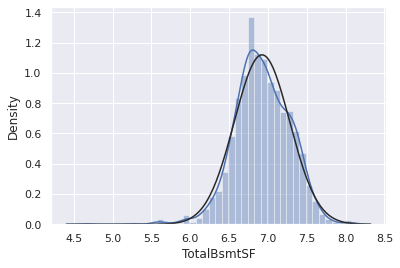

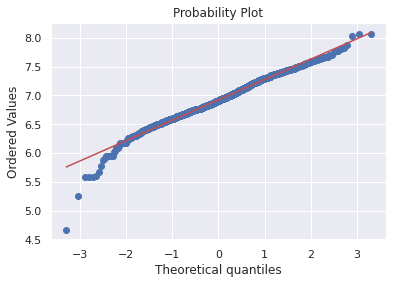

In [ ]:
#histogram and normal probability plot
sns.distplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], fit=norm);
fig = plt.figure()
res = stats.probplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], plot=plt)

### В поисках написания «гомоскедастичность» с первой попытки

Наилучший подход к проверке гомоскедастичности для двух метрических переменных — графический. Отклонения от равной дисперсии показаны такими фигурами, как конусы (малая дисперсия с одной стороны графика, большая дисперсия с противоположной стороны) или ромбы (большое количество точек в центре распределения).

Начиная с "SalePrice" и "GrLivArea"...

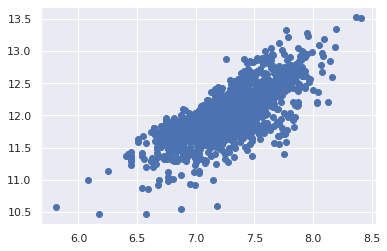

In [ ]:
#scatter plot
plt.scatter(df_train['GrLivArea'], df_train['SalePrice']);

Старые версии этого точечного графика (до регистрации преобразований) имели коническую форму (вернитесь назад и проверьте «График рассеяния между «SalePrice» и коррелированными переменными»). Как видите, текущая диаграмма рассеяния больше не имеет конической формы. Это сила нормальности! Просто обеспечив нормальность некоторых переменных, мы решили проблему гомоскедастичности.

Теперь давайте проверим «SalePrice» с «TotalBsmtSF».

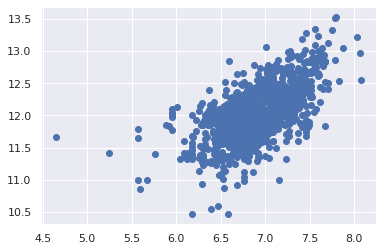

In [ ]:
#scatter plot
plt.scatter(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], \
            df_train[df_train['TotalBsmtSF']>0]['SalePrice']);

Мы можем сказать, что, в целом, «SalePrice» демонстрируют одинаковые уровни дисперсии по всему диапазону «TotalBsmtSF».

# И последнее, но не менее важное: фиктивные переменные (dummy variables)

Легкий режим.

In [ ]:
#convert categorical variable into dummy
df_train = pd.get_dummies(df_train)

# Вывод

Вот и все! Мы подошли к концу нашего упражнения.

В этом ядре мы применяем на практике многие стратегии, предложенные [Hair et al. (2013)] (https://amzn.to/2uC3j9p). Мы философски относились к переменным, мы анализировали «SalePrice» отдельно и с наиболее коррелированными переменными, мы имели дело с отсутствующими данными и выбросами, мы проверили некоторые фундаментальные статистические предположения и даже преобразовали категориальные переменные в фиктивные переменные. Это большой объем работы, которую Python помог нам упростить.

Но квест не окончен. Помните, что наша история остановилась на исследовании Facebook. Теперь пришло время позвонить «SalePrice» и пригласить ее на ужин. Попробуйте предсказать ее поведение. Как вы думаете, она девушка, которой нравятся подходы регуляризованной линейной регрессии? Или вы думаете, что она предпочитает ансамблевые методы? Или, может быть, что-то еще?

Это зависит от вас, чтобы узнать.

# <b>References</b>
* [My blog](http://pmarcelino.com)
* [My other kernels](https://www.kaggle.com/pmarcelino/data-analysis-and-feature-extraction-with-python)
* [Hair et al., 2013, Multivariate Data Analysis, 7th Edition](https://amzn.to/2JuDmvo)

# Благодарности

Спасибо [João Rico] (https://www.linkedin.com/in/joaomiguelrico/) за то, что он прочитал черновики.